In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def draw_rect(im, cords, color = None):
    """Draw the rectangle on the image
    
    Parameters
    ----------
    
    im : numpy.ndarray
        numpy image 
    
    cords: numpy.ndarray
        Numpy array containing bounding boxes of shape `N X 4` where N is the 
        number of bounding boxes and the bounding boxes are represented in the
        format `x1 y1 x2 y2`
        
    Returns
    -------
    
    numpy.ndarray
        numpy image with bounding boxes drawn on it
        
    """
    
    im = im.copy()
    
    cords = cords[:,:4]
    cords = cords.reshape(-1,4)
    if not color:
        color = [255,0,0]
    for cord in cords:
        
        pt1, pt2 = (cord[0], cord[1]) , (cord[2], cord[3])
                
        pt1 = int(pt1[0]), int(pt1[1])
        pt2 = int(pt2[0]), int(pt2[1])
    
        im = cv2.rectangle(im.copy(), pt1, pt2, color, int(max(im.shape[:2])/200))
    return im

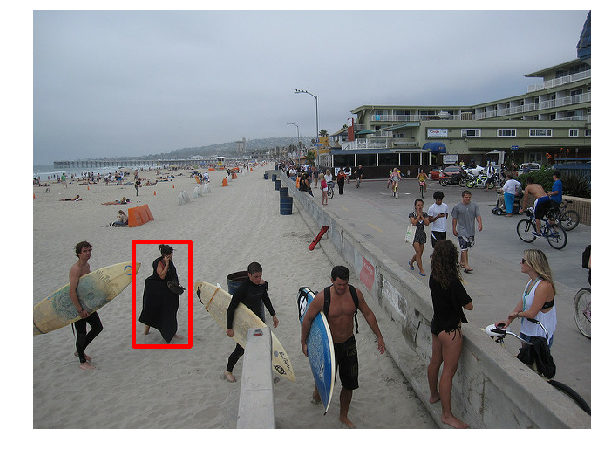

In [3]:
image_raw_data = tf.gfile.GFile('./1.jpg','rb').read()
image = tf.image.decode_jpeg(image_raw_data)
sess = tf.Session()
img = sess.run(image)
plt.figure(figsize=(10,10))
# 这里的box是带标签的
box = [115,265,180,385,1]
plt.imshow(draw_rect(img,np.array([box])))
plt.axis('off')
plt.show()

# 带bounding box的图像旋转

In [4]:
import math
def get_corners(bboxes):
    
    """Get corners of bounding boxes
    
    Parameters
    ----------
    
    bboxes: numpy.ndarray
        Numpy array containing bounding boxes of shape `N X 4` where N is the 
        number of bounding boxes and the bounding boxes are represented in the
        format `x1 y1 x2 y2`
    
    returns
    -------
    
    numpy.ndarray
        Numpy array of shape `N x 8` containing N bounding boxes each described by their 
        corner co-ordinates `x1 y1 x2 y2 x3 y3 x4 y4`      
        
    """
    width = (bboxes[:,2] - bboxes[:,0]).reshape(-1,1)
    height = (bboxes[:,3] - bboxes[:,1]).reshape(-1,1)
    
    x1 = bboxes[:,0].reshape(-1,1)
    y1 = bboxes[:,1].reshape(-1,1)
    
    x2 = x1 + width
    y2 = y1 
    
    x3 = x1
    y3 = y1 + height
    
    x4 = bboxes[:,2].reshape(-1,1)
    y4 = bboxes[:,3].reshape(-1,1)
    
    corners = np.hstack((x1,y1,x2,y2,x3,y3,x4,y4))
    
    return corners

def rotate_box(corners,angle,  cx, cy):
    
    """Rotate the bounding box.
    
    
    Parameters
    ----------
    
    corners : numpy.ndarray
        Numpy array of shape `N x 8` containing N bounding boxes each described by their 
        corner co-ordinates `x1 y1 x2 y2 x3 y3 x4 y4`
    
    angle : float
        angle by which the image is to be rotated
        
    cx : int
        x coordinate of the center of image (about which the box will be rotated)
        
    cy : int
        y coordinate of the center of image (about which the box will be rotated)
        
    h : int 
        height of the image
        
    w : int 
        width of the image
    
    Returns
    -------
    
    numpy.ndarray
        Numpy array of shape `N x 8` containing N rotated bounding boxes each described by their 
        corner co-ordinates `x1 y1 x2 y2 x3 y3 x4 y4`
    """
    corners = corners.reshape(-1,2)
    rotate_corners = np.zeros(corners.shape)
    rotate_corners[:,0] = (corners[:,0] - cx)*np.cos(-angle) - (corners[:,1] - cy)*np.sin(-angle) + cx
    rotate_corners[:,1] = (corners[:,0] - cx)*np.sin(-angle) + (corners[:,1] - cy)*np.cos(-angle) + cy
    rotate_corners = rotate_corners.reshape(-1,8)

    return rotate_corners

def get_enclosing_box(corners):
    """Get an enclosing box for ratated corners of a bounding box
    
    Parameters
    ----------
    
    corners : numpy.ndarray
        Numpy array of shape `N x 8` containing N bounding boxes each described by their 
        corner co-ordinates `x1 y1 x2 y2 x3 y3 x4 y4`  
    
    Returns 
    -------
    
    numpy.ndarray
        Numpy array containing enclosing bounding boxes of shape `N X 4` where N is the 
        number of bounding boxes and the bounding boxes are represented in the
        format `x1 y1 x2 y2`
        
    """
    x_ = corners[:,[0,2,4,6]]
    y_ = corners[:,[1,3,5,7]]
    
    xmin = np.min(x_,1).reshape(-1,1)
    ymin = np.min(y_,1).reshape(-1,1)
    xmax = np.max(x_,1).reshape(-1,1)
    ymax = np.max(y_,1).reshape(-1,1)
    
    final = np.hstack((xmin, ymin, xmax, ymax,corners[:,8:]))
    
    return final

def object_rotation(boxes,cx,cy,angle):
    
    print('chcek angle ', angle*180/3.14)
    corners = get_corners(boxes)
    rotation_corners = rotate_box(corners,angle,cx,cy)
    rotation_boxes = get_enclosing_box(rotation_corners)
    # 检查边界
    rotation_boxes[:, 0] = np.maximum(rotation_boxes[:, 0], 0.)
    rotation_boxes[:, 1] = np.maximum(rotation_boxes[:, 1], 0.)
    rotation_boxes[:, 2] = np.minimum(rotation_boxes[:, 2], 2*cx)
    rotation_boxes[:, 3] = np.minimum(rotation_boxes[:, 3], 2*cy)
    return rotation_boxes.astype(np.float32) 

def random_rotation(image, gt_boxes):
    # minval maxval 不能以参数的形式传进去，后头检查原因
    ang = tf.random_uniform(shape=[], minval=math.radians(-20),maxval=math.radians(20))
    rotation = tf.contrib.image.rotate(image,ang)
    h, w = tf.cast(tf.shape(image)[0], tf.float32), tf.cast(tf.shape(image)[1], tf.float32)
    rotboxes = tf.py_func(object_rotation,[gt_boxes[:,0:4], w/2, h/2, ang],tf.float32)
    rotboxes = tf.concat([rotboxes,tf.cast(gt_boxes[:,4:],tf.float32)], axis=-1)
    return rotation, rotboxes

chcek angle  17.851132875794818


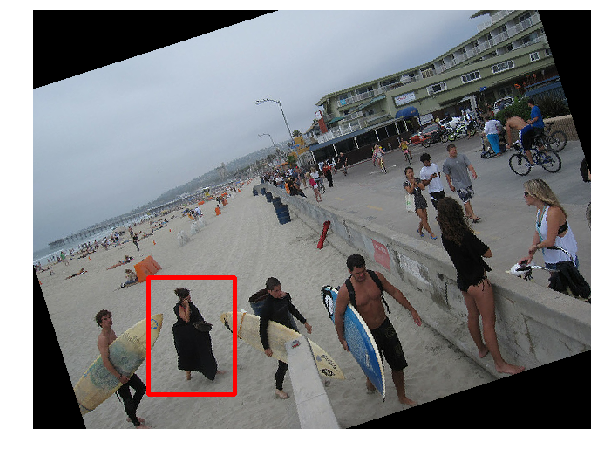

[[115 265 180 385   1]]
[[132.51942 306.69284 231.16057 440.83704   1.     ]]
chcek angle  -15.936595998751889


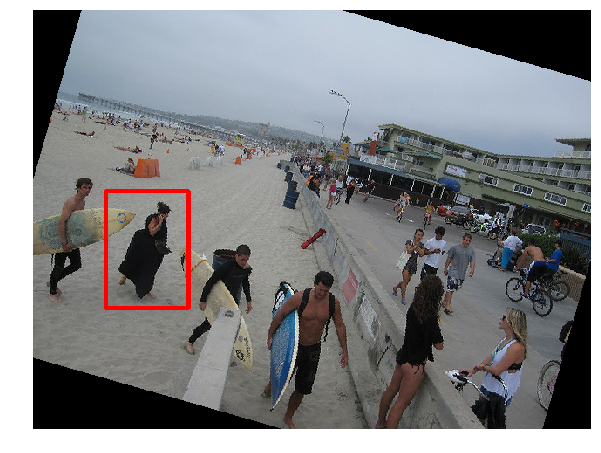

[[115 265 180 385   1]]
[[ 83.07752 207.78036 178.51437 341.0114    1.     ]]
chcek angle  2.2966064465273717


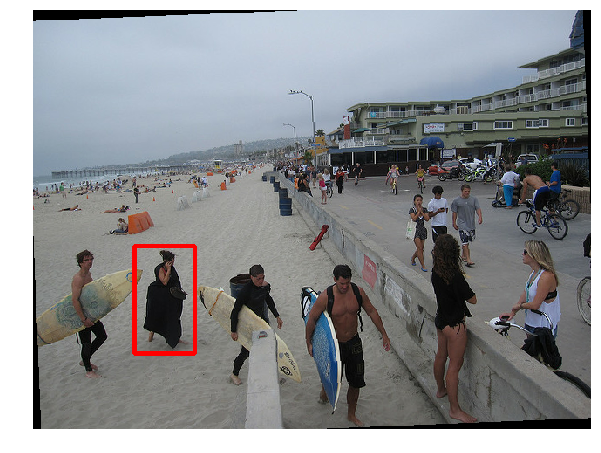

[[115 265 180 385   1]]
[[116.1658  270.58725 185.91992 393.09436   1.     ]]
chcek angle  17.673143535662607


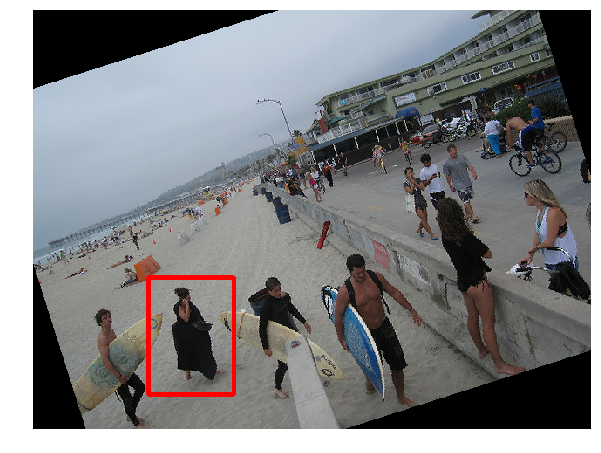

[[115 265 180 385   1]]
[[132.2514  306.30252 230.59924 440.36813   1.     ]]
chcek angle  17.802015990967963


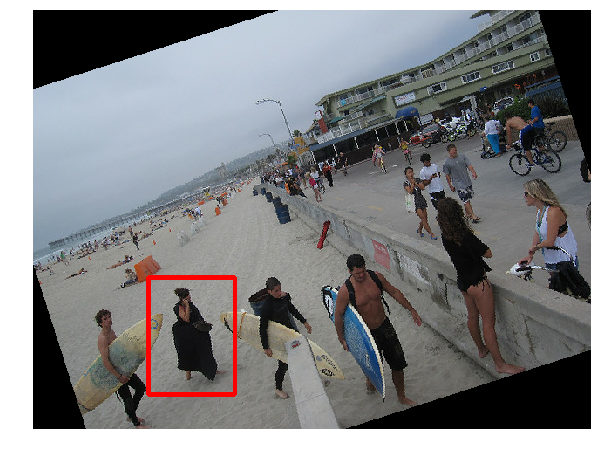

[[115 265 180 385   1]]
[[132.44528 306.5852  231.00558 440.70786   1.     ]]
chcek angle  -0.843689699841153


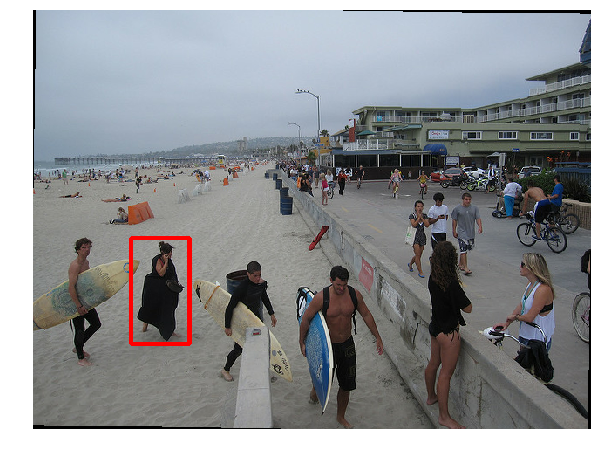

[[115 265 180 385   1]]
[[112.888214 261.9803   179.64723  382.9239     1.      ]]
chcek angle  6.873157183835461


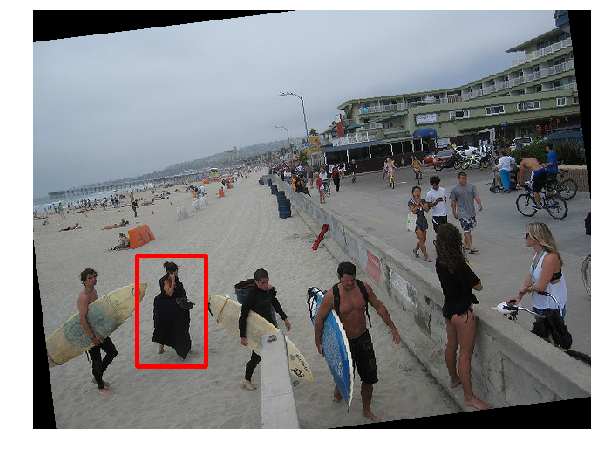

[[115 265 180 385   1]]
[[119.46202 281.5661  198.34874 408.47934   1.     ]]
chcek angle  -11.42588922172595


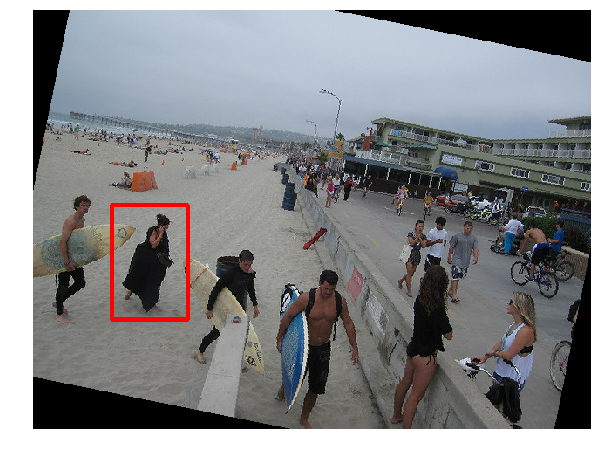

[[115 265 180 385   1]]
[[ 90.348465 223.91481  177.82172  354.4091     1.      ]]
chcek angle  -1.2016757658332775


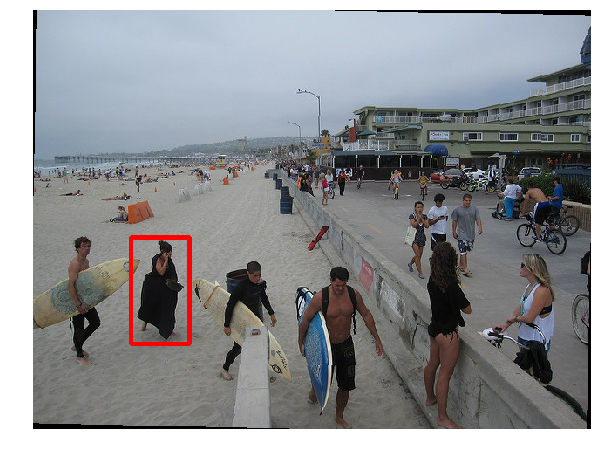

[[115 265 180 385   1]]
[[112.00569 260.6975  179.50673 382.0336    1.     ]]
chcek angle  12.186399690664498


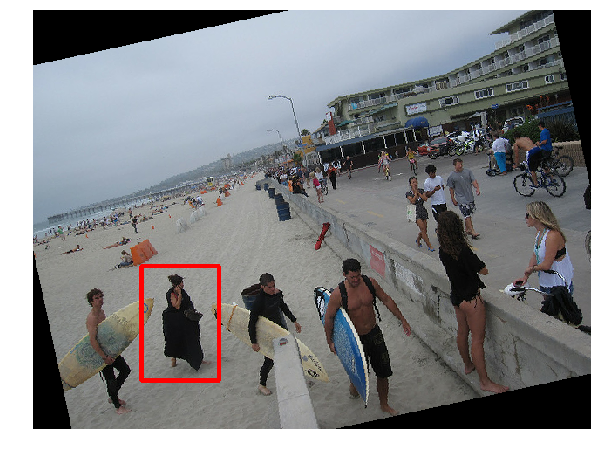

[[115 265 180 385   1]]
[[124.88949 293.97546 213.74475 424.98828   1.     ]]


In [5]:
boxes = tf.constant(np.array([box]))
'''
ang = tf.random_uniform(shape=[], minval=math.radians(-60),maxval=math.radians(60))
rotation = tf.contrib.image.rotate(image,ang)
h, w = tf.cast(tf.shape(image)[0], tf.float32), tf.cast(tf.shape(image)[1], tf.float32)
rotboxes = tf.py_func(object_rotation,[boxes[:,0:4], w/2, h/2, ang],tf.float32)
rotboxes = tf.concat([rotboxes,tf.cast(boxes[:,4:],tf.float32)], axis=-1)
'''
rotation, rotboxes = random_rotation(image,boxes)
for i in range(10):
    b,ims,rbox = sess.run([boxes,rotation,rotboxes])
    plt.figure(figsize=(10,10))
    plt.imshow(draw_rect(ims,rbox))
    plt.axis('off')
    plt.show()
    
    print(b)
    print(rbox)

# tensorflow的常用的图像操作

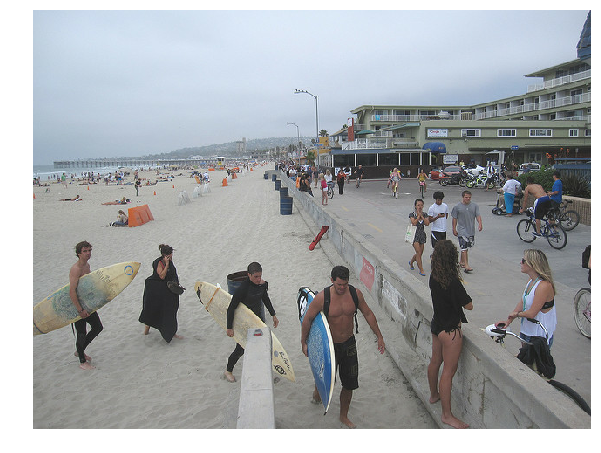

255


In [9]:
random_brightness = tf.image.random_brightness(image, max_delta=0.5)
img = sess.run(random_brightness)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()
print(np.max(img))

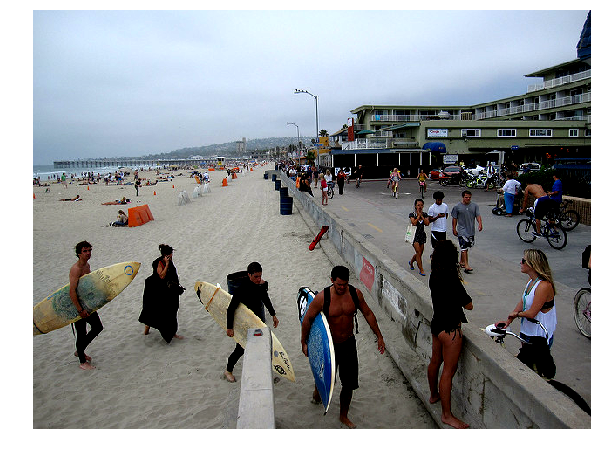

255


In [15]:
random_constrast = tf.image.random_contrast(image, lower=.5,upper=2)
img = sess.run(random_constrast)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()
print(np.max(img))

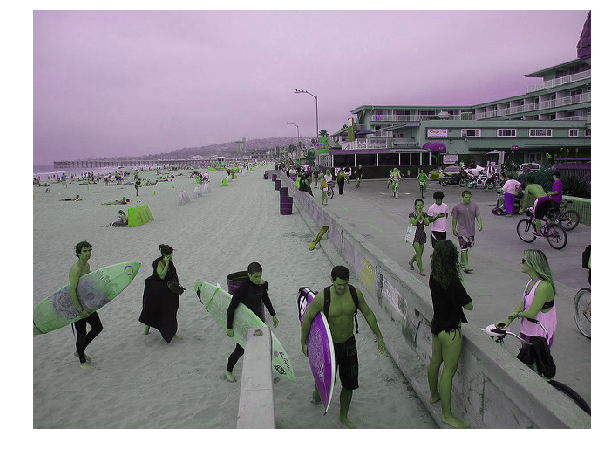

255


In [17]:
random_hue = tf.image.random_hue(image, max_delta=0.5)
img = sess.run(random_hue)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()
print(np.max(img))

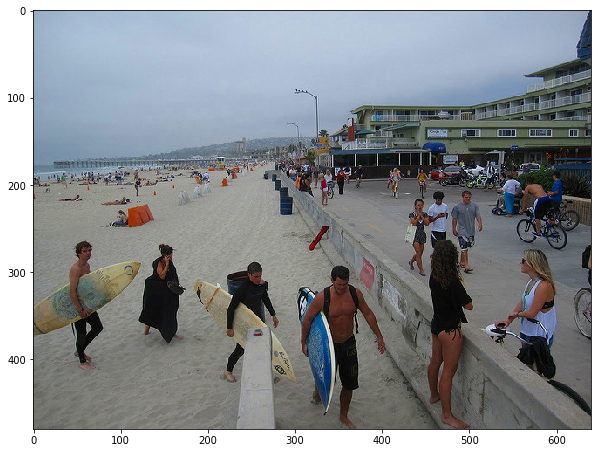

255


In [18]:
random_satu = tf.image.random_saturation(image, lower=0.5, upper=1.5)
img = sess.run(random_satu)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()
print(np.max(img))

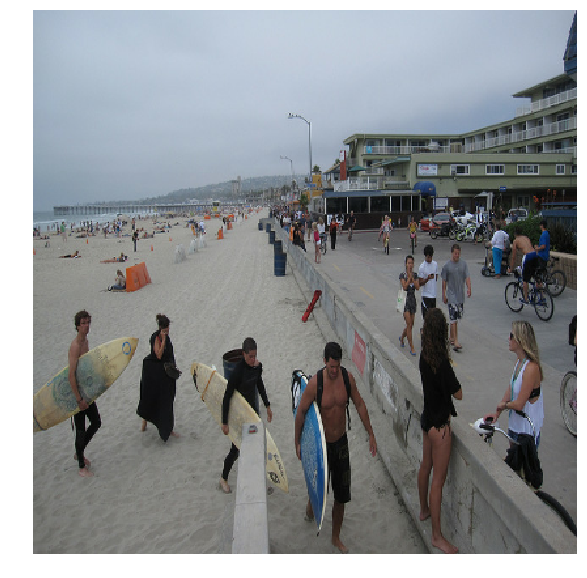

1.0
0.0
0.9837106
0.0


In [19]:
# 实验发现，convert_image_dtye会将[0,255]转换成[0.,1.]
img_data = tf.image.convert_image_dtype(image,dtype=tf.float32)
resized_image = tf.image.resize_images(img_data,(416,416),method=0)
ori = sess.run(img_data)
img = sess.run(resized_image)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()
print(np.max(ori))
print(np.min(ori))

print(np.max(img))
print(np.min(img))

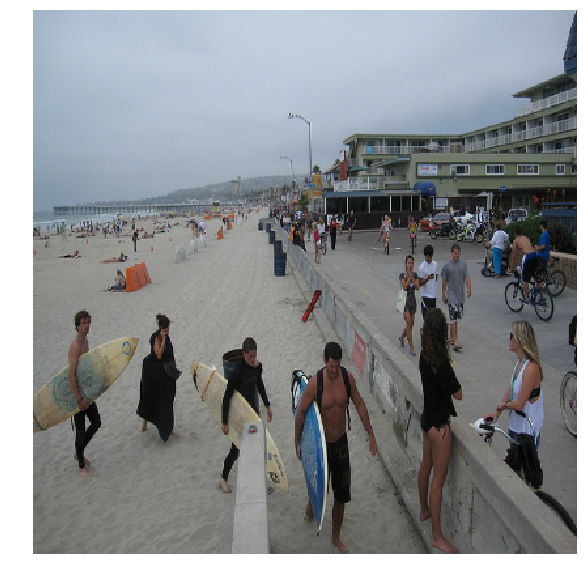

In [20]:
# resize_image函数会使输出的类型发生变化
resized = tf.image.resize_images(image,(416,416) ,method=0)
img = sess.run(resized/255.)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.show()

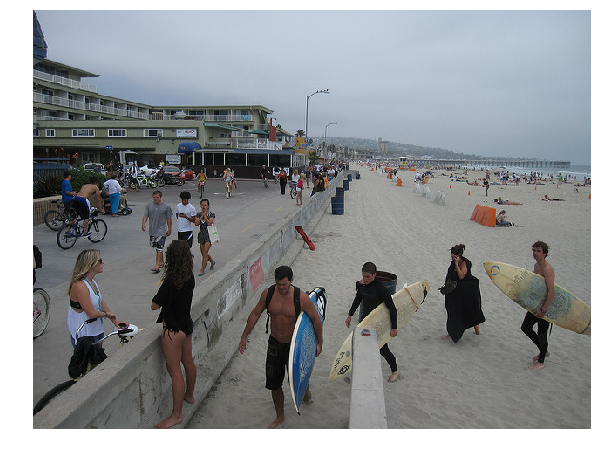

In [23]:
flip = tf.image.random_flip_left_right(image)
img = sess.run(flip)
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.axis('off')
plt.show()

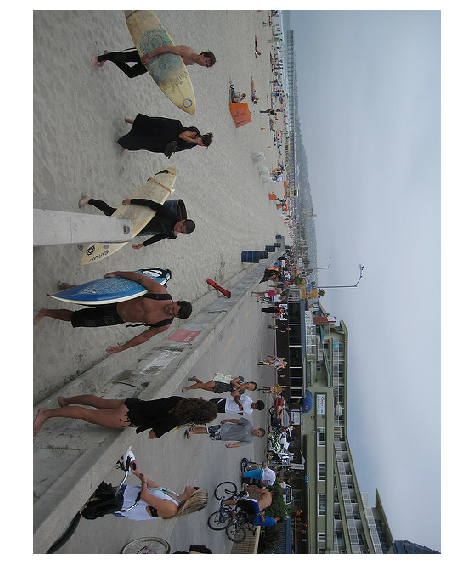

In [26]:
rotation90 = tf.image.rot90(image,k=3)
img = sess.run(rotation90)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.show()

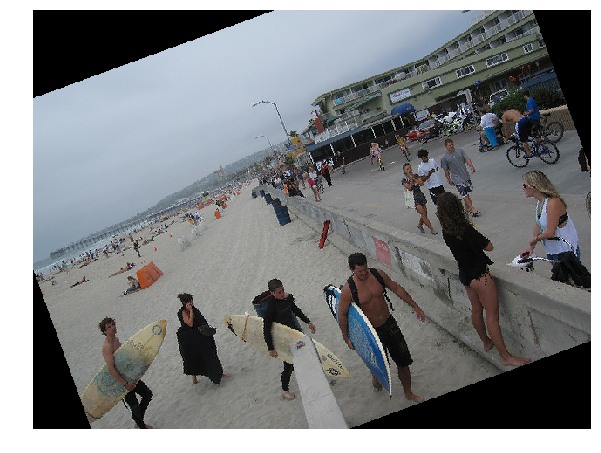

In [27]:
rotation = tf.contrib.image.rotate(image,20*np.pi/180)
img = sess.run(rotation)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(img)
plt.show()

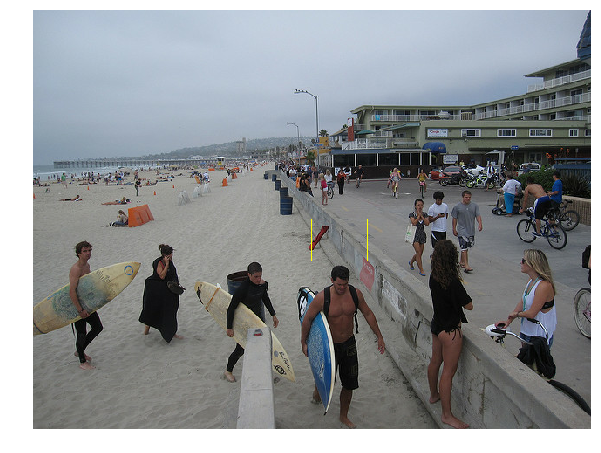

In [29]:
images = tf.expand_dims(image,axis=0)
images =  tf.image.convert_image_dtype(images,dtype=tf.float32)
box = tf.constant([[[0.5,0.5,0.6,0.6]]])
draw_image = tf.image.draw_bounding_boxes(images,box)
imgs = sess.run(draw_image)
plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(imgs[0])
plt.show()